In [ ]:

#!unzip "/content/drive/MyDrive/dog-breed-identification.zip" -d "/content/drive/MyDrive"

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
hub.__version__

tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

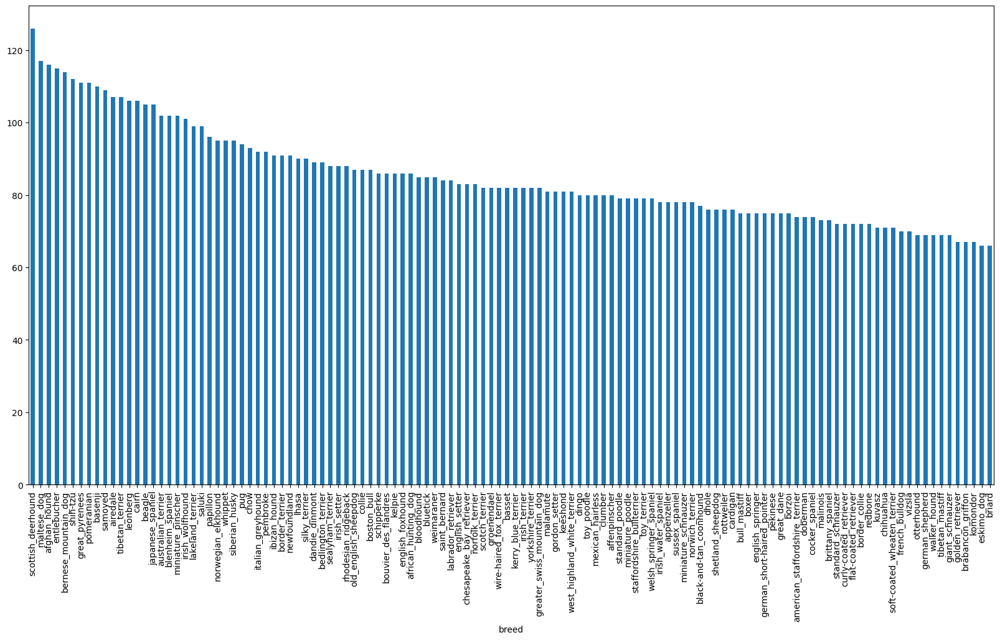

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

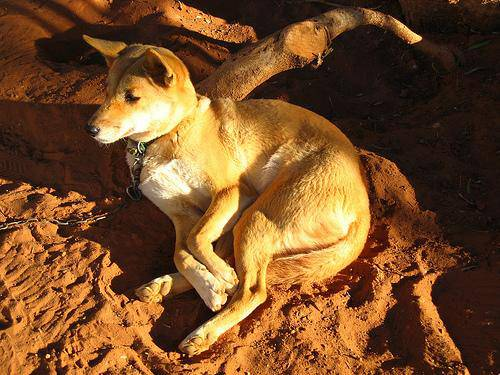

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
# pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]


['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files! Proceed")
else:
  print("Filenames do not match actual amount of files, check the target directory")


Filenames match actual amount of files! Proceed


In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

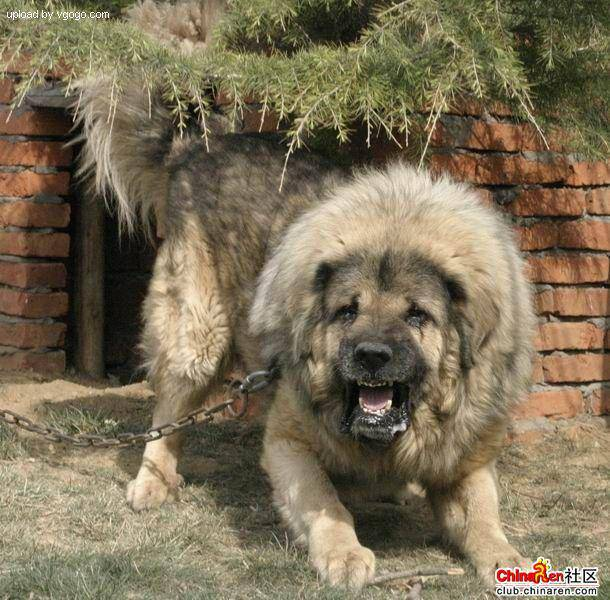

In [ ]:
Image(filenames[9000])

In [ ]:
labels = labels_csv["breed"].to_numpy()
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print ("ok")
else:
  print("check data directory")

ok


In [ ]:
# unique labels values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# creating validation set
X = filenames
y = boolean_labels


In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

In [ ]:
# Image into Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image Size
IMG_SIZE =224

def process_image(image_path, img_size=IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)

  #convert the colour channels from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label


In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
      print("Creating test batches...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
      data_batch = data.map(process_image).batch(BATCH_SIZE)
      return data_batch


    elif valid_data:
      print("Creating validation Data...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

    else:
      print("Creating training data batches...")

      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
      data = data.shuffle(buffer_size=len(X))
      data = data.map(get_image_label)

      data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation Data...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])

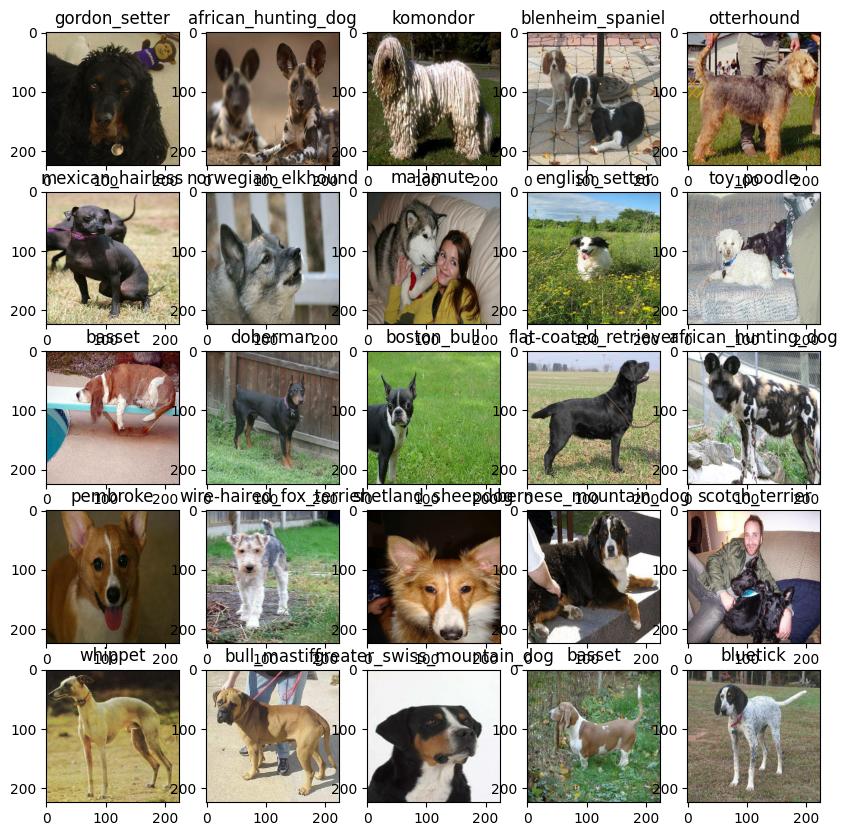

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

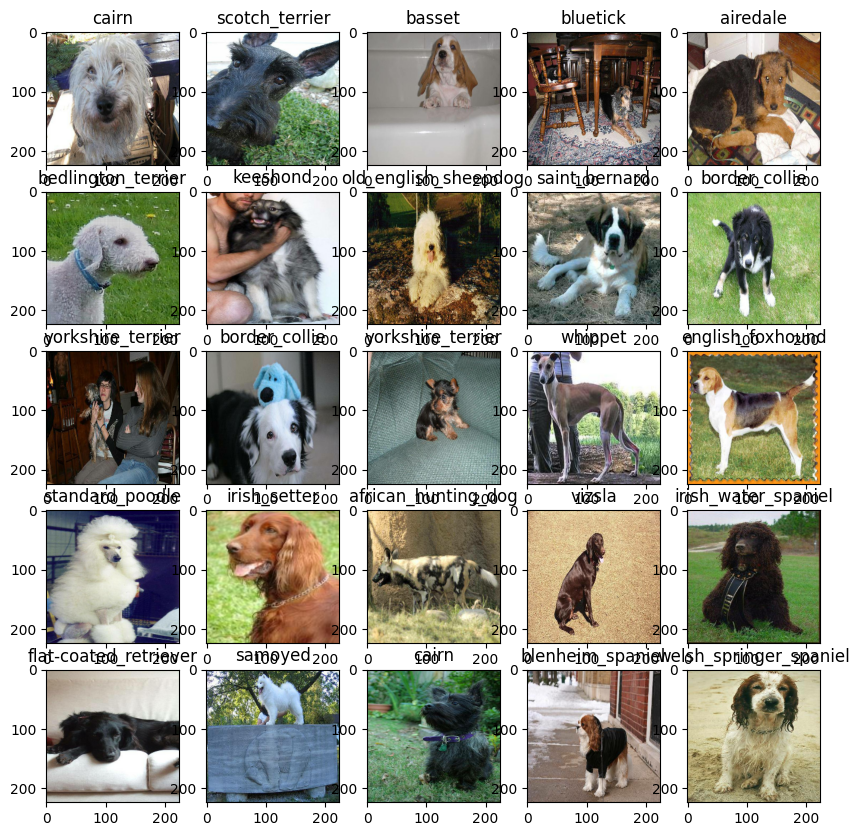

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

In [ ]:
# Setup imput shape to model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  model = tf.keras.Sequential([
      tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL)(x)),  # Wrap in Lambda layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                             activation='softmax')
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]

  )
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating Callback

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
def create_tensorboard_callback():
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

In [ ]:
NUM_EPOCHS = 100#@param {type: "slider", min:10, max:100}

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()


Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 150s 5s/step - accuracy: 0.0428 - loss: 5.1451 - val_accuracy: 0.3150 - val_loss: 3.3453
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 199ms/step - accuracy: 0.6176 - loss: 1.9747 - val_accuracy: 0.5000 - val_loss: 2.1636
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 0.9112 - loss: 0.6256 - val_accuracy: 0.5750 - val_loss: 1.6609
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - accuracy: 0.9779 - loss: 0.2959 - val_accuracy: 0.6450 - val_loss: 1.4680
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 192ms/step - accuracy: 0.9997 - loss: 0.1472 - val_accuracy: 0.6350 - val_loss: 1.4005
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - accuracy: 0.9990 - loss: 0.1002 - val_accuracy: 0.6400 - val_loss: 1.3660
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - accuracy: 1.0000 - loss: 0.0798 - val_accuracy: 0.6400 - val_los

In [ ]:
%tensorboard --logdir drive/My\Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making Predictions using tranied model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 845ms/step


array([[2.5328267e-03, 2.6304537e-04, 3.2389199e-04, ..., 1.3311808e-04,
        3.3074368e-05, 2.8771653e-03],
       [5.2311630e-03, 2.0716374e-03, 1.4805442e-02, ..., 3.4553262e-03,
        4.3789721e-03, 5.8888289e-04],
       [2.2775808e-04, 4.9987168e-05, 4.5848743e-04, ..., 4.1633099e-04,
        4.9157313e-04, 1.2535150e-03],
       ...,
       [1.2204689e-05, 2.0637647e-04, 2.6280060e-04, ..., 2.2661827e-04,
        8.4498985e-05, 1.1451912e-05],
       [1.1079892e-02, 5.2715471e-04, 9.0148053e-05, ..., 5.2096555e-04,
        1.9852073e-04, 5.7298545e-02],
       [2.1092361e-04, 1.1240947e-04, 4.9748360e-03, ..., 1.9303290e-02,
        1.4092169e-03, 1.0638306e-04]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
index = 42
print(predictions[index])
print(f"Max value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.9478059e-04 2.2562410e-04 2.7169561e-04 1.2317888e-04 1.1437981e-03
 1.3028347e-04 7.4343807e-05 1.7024862e-03 9.5794955e-03 3.7811816e-02
 9.3229624e-05 6.7362380e-05 6.7866466e-04 5.8230381e-03 1.7563723e-03
 1.7578745e-03 3.6997953e-05 6.5960386e-04 1.7389686e-04 1.4498580e-04
 4.5110126e-05 2.7366076e-04 2.1961321e-05 3.6331967e-05 1.4935224e-02
 3.9295875e-05 3.9675203e-04 2.7510256e-04 9.1113398e-05 1.7165999e-05
 3.8173559e-05 1.8647320e-04 1.9924391e-04 1.8479535e-05 1.4674033e-04
 8.2399471e-05 1.6545302e-04 1.2035551e-04 2.1663970e-04 5.3447491e-01
 1.0400179e-04 3.1624455e-05 1.3010839e-02 7.0066235e-05 1.1331419e-04
 1.2554435e-05 1.2845054e-04 5.7963299e-04 1.8801489e-04 5.2639111e-03
 8.0982078e-05 4.9255832e-05 1.3460231e-04 3.3192248e-03 4.1092000e-05
 3.1899536e-04 3.6077054e-05 2.6936974e-05 5.0005218e-04 6.7889538e-05
 8.2365841e-05 3.9747937e-04 5.2416735e-06 1.2982555e-04 1.0505136e-04
 3.7252797e-05 9.9306613e-05 5.8591377e-04 5.3086555e-05 1.5599933e-05
 6.831

In [ ]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label

'ibizan_hound'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (iamge,label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truh for image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color = color)

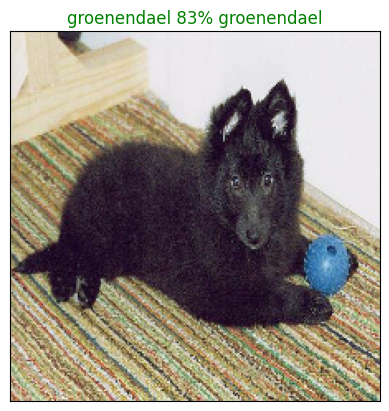

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

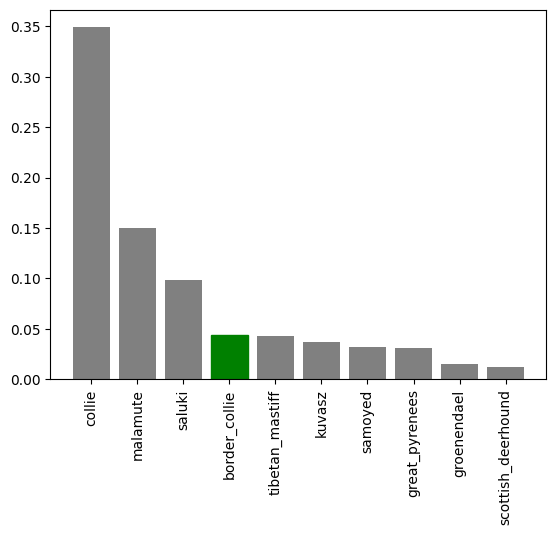

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)


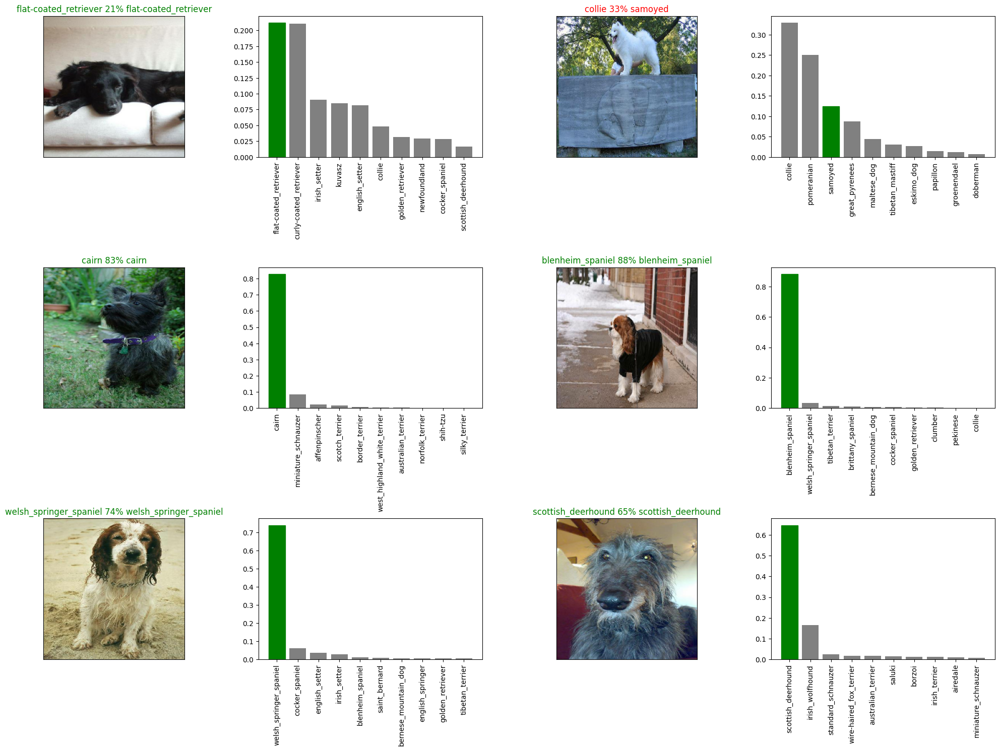

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  """
  saves a given model in a models directory and appends a suffix (string).
  """
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path, handling TensorFlow Hub layers.
  """
  print(f"Loading saved model from: {model_path}")
  # Define a custom object scope to handle KerasLayer objects
  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer': lambda x: hub.KerasLayer(x)})
  return model

In [ ]:
save_model(model, suffix="1000_images_mobilenetv2_Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20240807-05271723008430_1000_images_mobilenetv2_Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20240807-05271723008430_1000_images_mobilenetv2_Adam.h5'

In [ ]:
model.evaluate(val_data)